# Four global indices accessing civil liberties and economy

In May 2022, Reporters without Borders published their annual results comparing the level of press freedom enjoyed by journalists and media in 180 countries and territories. Several news agencies in my country (Greece) criticized its placement (pos. 108), a substantial drop from the 2021 70th position.
To cross-validate the results, I searched for other global indices created by non-governmental organizations assessing the condition of political rights and civil liberties around the world.

The four indices presented below are:

<table style="min-width:70%">
    <tr>
        <td style="text-align:center;"><a href="#press">The World Press Freedom Index by<br>Reporters without Borders</a></td>
        <td>(press_2021.csv, press_2022.csv)</td>
    </tr>
    <tr>
        <td style="text-align:center;"><a href="#freedom">The Freedom in the World annual report by<br> the Freedom House</a></td>
        <td>Aggregate_Category_and_Subcategory_Scores_FIW_2003-2022.xlsx</td>
    </tr>
    <tr>
        <td style='text-align:center;'>
            <a href="#law">The Rule of Law Index by<br> the World Justice Project</a>
        </td>
        <td>FINAL_2021_wjp_rule_of_law_index_HISTORICAL_DATA_FILE.xlsx</td>
    </tr>
    <tr>
        <td style="text-align:center;">
            <a href="#cpi">The Corruption Perceptions Index by <br>the Transparency  International movement</a>
        </td>
        <td>CPI2021_GlobalResults&Trends.xlsx</td>
    </tr>
    <tr>
        <td colspan="2" style='text-align:center;'>
            <a href="#combined">Combined Results Table</a>
        </td>
    <tr>
</table>

By comparing these four indices, I am hoping to find similar trends pertaining to human rights in each country.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import inset_locator
import geopandas as gpd
import pprint
from fuzzywuzzy import process

plt.style.use('fivethirtyeight')

<a id='press'></a>

## World Press Freedom Index by RSF

### Who Published It?
The World Press Freedom Index is published annually by Reporters Without Borders (RSF), an international non-profit and non-governmental organization founded in 1985 in Montpellier (France) by four journalists. RSF's stated mission is safeguarding the right to freedom of information. It assists journalists at risk, training them in digital and physical security, and campaigning to raise public awareness of abuse against journalists securing their safety and liberty. It has consultive status with the United Nations, UNESCO, the Council of Europe, and the International Organization of Francophonie.

### Scoring Methodology
The index's ranking is based on a score ranging from 0 to 100, assigned to each country or territory, with 100 representing the best possible score (the highest possible level of press freedom). It is calculated on the basis of two components:
- a quantitative tally of abuses against journalists in connection with their work, and against media outlets
- a qualitative analysis of the situation in each country or territory based on the responses of press freedom specialists (including journalists, researchers, academics and human rights defenders) to an RSF questionnaire available in 23 languages.

Each country or territory's score is evaluated using five contextual indicators: political context, legal framework, economic context, sociocultural context and safety.

The organization's main page is [https://rsf.org/en](https://rsf.org/en) and you can read [World Press Freedom Index](https://rsf.org/en/index) presentation, along with its analyses and methodology. 

### Data Preparation

In [2]:
# A simple script to scrape press freedom index for 2021-2022 because the 2022 file given is not right
#%run rsf_scraping.py

In [3]:
# Loading press index for 2022
press_index_file = "./data/press_2022.csv"

press_index = pd.read_csv(press_index_file, usecols=range(8))
press_index.info()
press_index.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Pos.          180 non-null    int64  
 1   Countries     180 non-null    object 
 2   Global score  180 non-null    float64
 3   Score pol.    180 non-null    float64
 4   Score eco.    180 non-null    float64
 5   Score legis.  180 non-null    float64
 6   Score soc.    180 non-null    float64
 7   Score secu.   180 non-null    float64
dtypes: float64(6), int64(1), object(1)
memory usage: 11.4+ KB


,Pos.,Countries,Global score,Score pol.,Score eco.,Score legis.,Score soc.,Score secu.
0,1,Norway,92.65,94.89,90.38,92.23,93.71,92.03
1,2,Denmark,90.27,94.34,83.67,89.18,91.17,92.97
2,3,Sweden,88.84,91.96,87.66,90.27,90.18,84.14
3,4,Estonia,88.83,91.11,81.97,87.87,90.00,93.20
4,5,Finland,88.42,90.40,82.03,86.64,90.77,92.26


In [4]:
# Renaming columns and checking for null values
press_index.columns = ['Pos.', 'Country', 'Global Score', 'Political', 'Economic', 'Legislation', 'Sociocultural', 'Safety']
press_index.isnull().sum()

Pos.             0
Country          0
Global Score     0
Political        0
Economic         0
Legislation      0
Sociocultural    0
Safety           0
dtype: int64

In [5]:
# Load world geometry used to plot choropleth maps
world = gpd.read_file('data/world.geo.json')
world.head()

,scalerank,featurecla,labelrank,sovereignt,sov_a3,adm0_dif,level,type,admin,adm0_a3,...,region_un,subregion,region_wb,name_len,long_len,abbrev_len,tiny,homepart,filename,geometry
0,1,Admin-0 country,6,Albania,ALB,0,2,Sovereign country,Albania,ALB,...,Europe,Southern Europe,Europe & Central Asia,7,7,4,-99,1,ALB.geojson,"POLYGON ((20.06396 42.54727, 20.10352 42.52466..."
1,1,Admin-0 country,5,Czech Republic,CZE,0,2,Sovereign country,Czech Republic,CZE,...,Europe,Eastern Europe,Europe & Central Asia,10,14,8,-99,1,CZE.geojson,"POLYGON ((14.80937 50.85898, 14.89580 50.86138..."
2,3,Admin-0 country,6,Finland,FI1,1,2,Country,Aland,ALD,...,Europe,Northern Europe,Europe & Central Asia,5,13,5,5,-99,ALA.geojson,"MULTIPOLYGON (((20.61133 60.04067, 20.60342 60..."
3,3,Admin-0 country,6,Andorra,AND,0,2,Sovereign country,Andorra,AND,...,Europe,Southern Europe,Europe & Central Asia,7,7,4,5,1,AND.geojson,"POLYGON ((1.70605 42.50332, 1.67852 42.49668, ..."
4,1,Admin-0 country,4,Austria,AUT,0,2,Sovereign country,Austria,AUT,...,Europe,Western Europe,Europe & Central Asia,7,7,5,-99,1,AUT.geojson,"POLYGON ((16.95312 48.59883, 16.94883 48.58857..."


In [6]:
def find_similar_countries(column1, column2, limit=2, threshold=50):
    """
    A function to find countries written slightly different using fuzzywuzzy library
        
    Args:
     - column1: DataFrame column values will be replaced
     - column2: DataFrame column values that will be used to replace column1
     - limit: How many possible matches will be printed
     - threshold: fuzzywuzzy similarity threshold filtering possible matches
     
    Returns:
     - A tuple of possible matches count and dictionary with the results
    """
    
    diff = list(set(column1) - set(column2))
    choices = list(set(column2) - set(column1))
    countries_match = {}
    
    for country in diff:
        countries_match[country] = [match[0]
                                  for match in process.extract(country, choices, limit=limit)
                                  if match[1] > threshold]
        
    return len(diff), countries_match

In [7]:
diff_count, possible_matches = find_similar_countries(press_index.Country, world.name_long)

print(diff_count)
pprint.pprint(possible_matches)

20
{'Bosnia-Herzegovina': ['Bosnia and Herzegovina', 'The Gambia'],
 'Brunei': ['Brunei Darussalam', 'Federated States of Micronesia'],
 'Cabo Verde': ['Cape Verde', 'Macao'],
 'Congo-Brazzaville': ['Democratic Republic of the Congo'],
 'Democratic Republic of Congo': ['Democratic Republic of the Congo',
                                  'Republic of Congo'],
 'Eswatini': ['Swaziland', 'Russian Federation'],
 'Gambia': ['The Gambia', 'Guam'],
 'Guinea Bissau': ['Guinea-Bissau', 'Nauru'],
 'Haïti': ['Haiti', 'Ashmore and Cartier Islands'],
 'Ivory Coast': ["Côte d'Ivoire", 'Haiti'],
 'Laos': ['Lao PDR', 'Barbados'],
 'Maldives': ['Saint Vincent and the Grenadines'],
 'Mauritius': ['Nauru', 'Haiti'],
 'Morocco / Western Sahara': ['Western Sahara', 'Morocco'],
 'North Korea': ['Republic of Korea', 'Northern Mariana Islands'],
 'North Macedonia': ['Macedonia', 'New Caledonia'],
 'OECS': ['Federated States of Micronesia'],
 'Russia': ['Russian Federation', 'Brunei Darussalam'],
 'Seychelles

In [8]:
# Country matches for press_index replacement
matches = {'Bosnia-Herzegovina': 'Bosnia and Herzegovina',
           'Brunei': 'Brunei Darussalam',
           'Cabo Verde': 'Cape Verde',
           'Congo-Brazzaville': 'Republic of Congo',
           'Democratic Republic of Congo': 'Democratic Republic of the Congo',
           'Eswatini': 'Swaziland',
           'Gambia': 'The Gambia',
           'Guinea Bissau': 'Guinea-Bissau',
           'Haïti': 'Haiti',
           'Ivory Coast': "Côte d'Ivoire",
           'Laos': 'Lao PDR'}

# Country matches for world_map replacement
opposite_matches = {'Dem. Rep. Korea': 'North Korea',
                    'Republic of Korea': 'South Korea',
                    'Russian Federation': 'Russia',
                    'Macedonia': 'North Macedonia'}

press_index.Country.replace(matches, inplace=True)

world_map = world[['name_long', 'geometry']].copy()
world_map.name_long.replace(opposite_matches, inplace=True)

In [9]:
# Split Morocco and Western Sahara in to two different records
press_index['Country'] = press_index['Country'].replace({'Morocco / Western Sahara': 'Morocco'})
temp = press_index[press_index.Country == 'Morocco'].copy()
temp['Country'] = temp.Country.replace({'Morocco': 'Western Sahara'})
press_index = pd.concat([press_index, temp], ignore_index=True)
press_index = press_index.sort_values(by='Pos.').reset_index(drop=True)

In [10]:
# Checking our changes
diff_count, possible_matches = find_similar_countries(press_index.Country, world_map.name_long)

print(diff_count)
pprint.pprint(possible_matches)

4
{'Maldives': ['Saint Vincent and the Grenadines'],
 'Mauritius': ['Nauru', 'Saint-Martin'],
 'OECS': ['Federated States of Micronesia'],
 'Seychelles': []}


In [11]:
# Various styler functions applied on dataframe table
def table_style(styler, caption, gradient_column, vmin, vmax, ttips=pd.DataFrame()):
    styler.set_caption(caption) # Table title
    styler.set_table_styles([{'selector': 'caption', 'props':'font-size:1.25em;'}], # Title style
                              overwrite=False)
    styler.format(precision=2) # rounding floats
    styler.background_gradient(subset='Pos.', cmap='RdYlGn', vmin=vmin, vmax=vmax, gmap=gradient_column) # applying background color
    styler.set_sticky(axis="columns") # Fixed column names
    styler.set_table_styles([ dict(selector='th', props=[('text-align', 'center')])], # Text allignment
                              overwrite=False)
    styler.set_table_styles([ dict(selector='td', props=[('text-align', 'left')])], # Text allignment
                              overwrite=False)
    styler.set_tooltips(ttips, css_class='tt-add', props=[
            ('visibility', 'hidden'),
            ('position', 'absolute'),
            ('z-index', '1'),
            ('background-color', 'yellow'),   # Setting hovering info
            ('color', 'red'),
            ('transform',  'translateX(10px)')
        ])
    return styler.hide()

In [12]:
# Loading press index for 2021 displaying hovering info
press_index_file_2021 = "./data/press_2021.csv"

press_index_prev = pd.read_csv(press_index_file_2021, usecols=range(3))
press_index_prev.columns = ['Pos.', 'Country', 'Global Score'] # rename columns
press_index_prev.Country.replace(matches, inplace=True) # replace same values as before

# Split Morocco and Western Sahara in to two different records
press_index_prev['Country'] = press_index_prev['Country'].replace({'Morocco / Western Sahara': 'Morocco'})
temp = press_index_prev[press_index.Country == 'Morocco'].copy()
temp['Country'] = temp.Country.replace({'Morocco': 'Western Sahara'})
press_index_prev = pd.concat([press_index_prev, temp], ignore_index=True)
press_index_prev = press_index_prev.sort_values(by='Pos.').reset_index(drop=True)

press_index_prev.shape

/tmp/ipykernel_6068/508993371.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  temp = press_index_prev[press_index.Country == 'Morocco'].copy()


(181, 3)

In [13]:
def create_ttips(df_prev, df):
    """
    Creates a DataFrame for previous year dataset,
    sorted by current year dataset and
    casting all values as string
    
    Args:
     - df_prev: Previous Year DataFrame
     - df: Current Year DataFrame
     
    returns:
     - Previous Year DataFrame with all values turned to strings
    """
    df_prev = df_prev.copy()
    df_prev.set_index('Country', inplace=True)
    df_prev = df_prev.reindex(index=df['Country'])
    df_prev.reset_index(inplace=True)

    ttips = df_prev.copy()
    ttips.Country = ttips.sort_values(by='Pos.').Country.values
    return ttips.astype(str)

In [14]:
ttips = create_ttips(press_index_prev, press_index)

### Worldwide Results

In [15]:
press_index.style.pipe(table_style, caption="2022 World Press Freedom Index", gradient_column=press_index['Global Score'], vmin=0, vmax=100, ttips=ttips)

Pos.,Country,Global Score,Political,Economic,Legislation,Sociocultural,Safety
1,Norway,92.65,94.89,90.38,92.23,93.71,92.03
2,Denmark,90.27,94.34,83.67,89.18,91.17,92.97
3,Sweden,88.84,91.96,87.66,90.27,90.18,84.14
4,Estonia,88.83,91.11,81.97,87.87,90.00,93.20
5,Finland,88.42,90.40,82.03,86.64,90.77,92.26
6,Ireland,88.30,89.24,79.08,85.09,92.50,95.58
7,Portugal,87.07,91.86,77.41,84.21,93.14,88.73
8,Costa Rica,85.92,81.62,72.96,87.72,92.50,94.78
9,Lithuania,84.14,87.01,72.16,84.46,89.71,87.37
10,Liechtenstein,84.03,80.36,68.78,84.74,89.80,96.46


#### Map Visualization

In [16]:
reporter_map = world_map.merge(press_index, how='left', left_on='name_long', right_on='Country')
reporter_map.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 232 entries, 0 to 231
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   name_long      232 non-null    object  
 1   geometry       232 non-null    geometry
 2   Pos.           177 non-null    float64 
 3   Country        177 non-null    object  
 4   Global Score   177 non-null    float64 
 5   Political      177 non-null    float64 
 6   Economic       177 non-null    float64 
 7   Legislation    177 non-null    float64 
 8   Sociocultural  177 non-null    float64 
 9   Safety         177 non-null    float64 
dtypes: float64(7), geometry(1), object(2)
memory usage: 19.9+ KB


In [17]:
# Plotting world map consistently across datasets
def plot_world_map(fig, ax, df, column, cmap, vmin, vmax, caption=''):
    
    # put colorbar inside the map
    axins = inset_locator.inset_axes(ax, width="50%", height="5%", loc='lower right', borderpad=2.5)
    
    # normalize colorbar with minimum and maximum values
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    
    # plot the choropleth
    df.plot(column=column,
            cmap=cmap,
            norm=norm,
            edgecolor="black",
            missing_kwds = dict(color='lightgrey'),
            legend=False,
            ax=ax
    )
    
    ax.grid(False) # remove grid
    ax.set_axis_off() # remove borders
    fig.colorbar(cbar, cax=axins, orientation='horizontal') # plot the colorbar
    axins.tick_params(labelsize=22)
    axins.set_title(caption, fontdict={'fontsize': 26, 'fontweight': 400})
    return fig

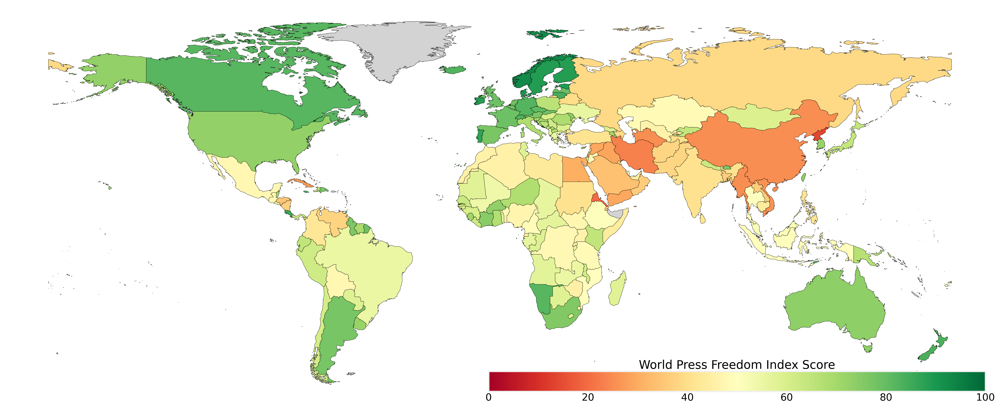

In [18]:
fig, ax = plt.subplots(figsize=(35, 20), dpi=200)
plot_world_map(fig, ax, reporter_map, 'Global Score', 'RdYlGn', vmin=0, vmax=100, caption="World Press Freedom Index Score");

### European Results

In [19]:
european_countries = ['Andorra', 'Hungary', 'Belarus', 'Austria', 'Serbia', 'Switzerland',
       'Germany', 'Andorra', 'Bulgaria', 'United Kingdom',
       'France', 'Montenegro', 'Luxembourg', 'Italy', 'Denmark',
       'Finland', 'Slovakia', 'Norway', 'Ireland', 'Spain', 'Malta',
       'Ukraine', 'Croatia', 'Moldova', 'Monaco', 'Liechtenstein',
       'Poland', 'Iceland', 'Bosnia and Herzegovina',
       'Albania', 'Lithuania', 'North Macedonia', 'Slovenia', 'Romania',
       'Latvia', 'Netherlands', 'Russia', 'Estonia', 'Belgium',
       'Czech Republic', 'Greece', 'Portugal', 'Sweden', 'San Marino']

In [20]:
# Selecting European Countries
press_index_eur = press_index[press_index.Country.isin(european_countries)].copy()

# Setting ranking just for Europe
press_index_eur['Pos.'] = press_index_eur['Global Score'].rank(ascending=False, method='first').astype(int)
press_index_eur = press_index_eur.sort_values(by='Pos.').reset_index(drop=True)

In [21]:
# Doing the same for previous year
press_index_eur_prev = press_index_prev[press_index_prev.Country.isin(european_countries)].copy()
press_index_eur_prev['Pos.'] = press_index_eur_prev['Global Score'].rank(ascending=False, method='first').astype(int)
press_index_eur_prev = press_index_eur_prev.reset_index(drop=True)

In [22]:
ttips = create_ttips(press_index_eur_prev, press_index_eur)

In [23]:
press_index_eur.style.pipe(table_style, caption="2022 World Press Freedom Index for Europe", gradient_column=press_index_eur['Global Score'], vmin=0, vmax=100, ttips=ttips)

Pos.,Country,Global Score,Political,Economic,Legislation,Sociocultural,Safety
1,Norway,92.65,94.89,90.38,92.23,93.71,92.03
2,Denmark,90.27,94.34,83.67,89.18,91.17,92.97
3,Sweden,88.84,91.96,87.66,90.27,90.18,84.14
4,Estonia,88.83,91.11,81.97,87.87,90.00,93.20
5,Finland,88.42,90.40,82.03,86.64,90.77,92.26
6,Ireland,88.30,89.24,79.08,85.09,92.50,95.58
7,Portugal,87.07,91.86,77.41,84.21,93.14,88.73
8,Lithuania,84.14,87.01,72.16,84.46,89.71,87.37
9,Liechtenstein,84.03,80.36,68.78,84.74,89.80,96.46
10,Switzerland,82.72,90.00,68.37,80.99,88.33,85.92


#### Map Visualization

In [24]:
# Plotting only Europe
reporter_map_eur = reporter_map.copy()
# By assigning non European countries np.nan will be displayed with grey color
reporter_map_eur.loc[~reporter_map_eur.Country.isin(european_countries), 'Global Score'] = np.nan

In [25]:
# Another plotting function just for Europe
def plot_europe_map(fig, ax, df, column, cmap, vmin, vmax, caption=''):
    
    # put colorbar inside the map
    axins = inset_locator.inset_axes(ax, width="50%", height="2%", loc='upper right', borderpad=5.5)
    
    # normalize colorbar with minimum and maximum values
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    
    df.plot(column=column,
            cmap=cmap,
            norm=norm,
            edgecolor="black",
            missing_kwds = dict(color='lightgrey'),
            legend=False,
            ax=ax)
    
    ax.set_xlim([-25, 40])
    ax.set_ylim([30, 90])
    ax.grid(False)
    ax.set_axis_off() # remove borders
    fig.colorbar(cbar, cax=axins, orientation='horizontal') # plot the colorbar
    axins.set_title(caption, fontdict={'fontsize': 18, 'fontweight': 400})
    return ax

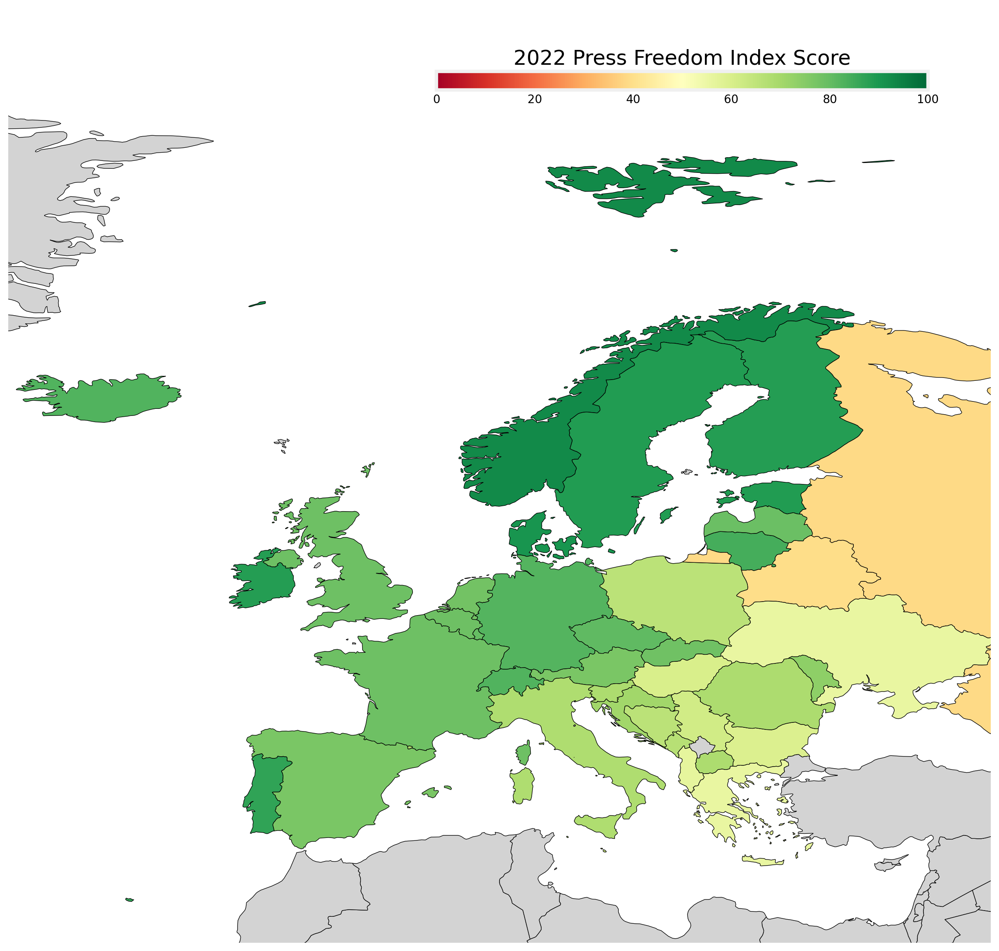

In [26]:
fig, ax = plt.subplots(figsize=(20, 15), dpi=200)
plot_europe_map(fig, ax, reporter_map_eur, 'Global Score', 'RdYlGn', vmin=0, vmax=100, caption="2022 Press Freedom Index Score");

### Notes and Conclusions
According to the 2022 edition of the World Press Freedom Index, the five top countries are all located in northern Europe. If we look at the world map we notice that Asian countries are in the worst position except for South Korea, Japan, Taiwan, Mongolia, Nepal, Bhutan, Kyrgyzstan, Armenia and Georgia. African countries are mostly ranked higher than Asian countries, particularly in southern Africa, except for Egypt, Libya, Sudan, Eritrea, and Somalia.

In Europe αs I mentioned at the beginning, after the drop of 38 places compared to 2021, Greece is only third to last, worse than all the Balkan countries with Russia and Belarus having the worst score by far. Even in the 2021 ranking, it was only in 30th place out of 41 countries, worse than most countries in the European Union.

According to RSF's report, press freedom in Greece suffered serious setbacks in 2021 and 2022, with journalists regularly prevented from covering issues from migration to Covid-19. Furthermore is noted the assassination of veteran crime reporter Giorgos Karaivaz in April 2021 remains unsolved.

The report notes that Greeks' trust in the media has been consistently one of the lowest in Europe. It highlights a lack of transparency in public funding for media outlets, with a few large private groups like Skai coexisting alongside hundreds of online media outlets, which contributes to the high fragmentation of the media landscape. The overwhelming majority of media is owned by a few individuals who are active also in other, highly-regulated business sectors, with some of them having close ties to the political elite.

<a id='freedom'></a>

## Freedom in the World Report by Freedom House

### Who published it?
The Freedom in the World report has been published since 1973  by the Freedom House, assessing the condition of political rights and civil liberties around the world. It is widely reported in the media and used as a source of research to measure democracy by policymakers, journalists, academics, and activists.
The Freedom House is a non-profit organization founded in Washington, D.C. in October 1941 by the U.S. government, contacting research and advocating for democracy, political freedom, and human rights. You can find more information about the Freedom House and its action on its website: [https://freedomhouse.org/about-us](https://freedomhouse.org/about-us)

### Score Methodology
Freedom in the World report produces annual scores representing the levels of political rights and civil liberties for 195 countries and 15 territories. External analysts access each country using a combination of on-the-ground research, consultations with local contracts, and information from news articles,  non-governmental organizations, governments, and other sources. Expert advisers, regional specialists, and Freedom House staff presents the results based on the analysts' conclusions. 

A country or territory is awarded from 0 to 4 points for each of 10 political rights indicators and 15 civil liberties indicators, which take the form of questions. A score of 0 represents the smallest degree of freedom and 4 the greatest degree of freedom.
Political rights questions are grouped into four subcategories:
- Electoral Process (3 questions)
- Political Pluralism and Participation (4 questions)
- Functioning of Government (3 questions)

Civil liberties questions are grouped into four subcategories:
- Freedom of Expression and Belief (4 questions)
- Associational and Organizational Rights (3 questions)
- Rule of Law (4 questions)
- Personal Autonomy and Individual Rights (4 questions).

The political rights section also contains an additional discretionary question addressing forced demographic change. For the discretionary question, a score of 1 to 4 may be subtracted, as applicable (the worse the situation, the more points may be subtracted).
The highest overall score that can be awarded is 100, consisting of 40 points for political rights and 60 points for civil liberties.

For more details about Freedom in the World Research methodology, you can read their report [here](https://freedomhouse.org/reports/freedom-world/freedom-world-research-methodology). Also, [here](https://freedomhouse.org/report/freedom-world) you can download the dataset I will use below.


### Data Preparation

In [27]:
file = 'data/Aggregate_Category_and_Subcategory_Scores_FIW_2003-2022.xlsx'

freedom_index_data = pd.read_excel(file, sheet_name='FIW06-22', usecols=[0, 3, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18])
freedom_index_data.info()
freedom_index_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3549 entries, 0 to 3548
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Country/Territory  3549 non-null   object
 1   Edition            3549 non-null   int64 
 2   A                  3549 non-null   int64 
 3   B                  3549 non-null   int64 
 4   C                  3549 non-null   int64 
 5   Add Q              3549 non-null   int64 
 6   PR                 3549 non-null   int64 
 7   D                  3549 non-null   int64 
 8   E                  3549 non-null   int64 
 9   F                  3549 non-null   int64 
 10  G                  3549 non-null   int64 
 11  CL                 3549 non-null   int64 
 12  Total              3549 non-null   int64 
dtypes: int64(12), object(1)
memory usage: 360.6+ KB


,Country/Territory,Edition,A,B,C,Add Q,PR,D,E,F,G,CL,Total
0,Abkhazia,2022,5,8,4,0,17,8,6,4,5,23,40
1,Afghanistan,2022,0,0,1,0,1,4,3,0,2,9,10
2,Albania,2022,9,12,7,0,28,13,8,9,9,39,67
3,Algeria,2022,3,4,3,0,10,6,3,6,7,22,32
4,Andorra,2022,12,15,11,0,38,14,11,15,15,55,93


In [28]:
freedom_index = freedom_index_data[freedom_index_data.Edition == 2022].drop(columns='Edition').copy()
freedom_index.columns = ['Country', 'Electoral Process', 'Political Pluralism', 'Functioning of Goverment',
                         'Discretionary Question', 'Political Rights Subtotal', 'Freedom of Expression and Belief',
                         'Associational and Organizational Rights', 'Rule of Law',
                         'Personal Autonomy and Individual Rights', 'Civil Liberties Subtotal', 'Total Score']
freedom_index.shape

(210, 12)

In [29]:
# Searching for countries with different names in each dataset
diff_count, possible_matches = find_similar_countries(freedom_index.Country, world_map.name_long)
print(diff_count)
pprint.pprint(possible_matches)

27
{'Abkhazia': ['Aruba'],
 'Brunei': ['Brunei Darussalam', 'Federated States of Micronesia'],
 'Cabo Verde': ['Cape Verde', 'Macao'],
 'Congo (Brazzaville)': ['Democratic Republic of the Congo'],
 'Congo (Kinshasa)': ['Democratic Republic of the Congo', 'Cook Islands'],
 "Cote d'Ivoire": ["Côte d'Ivoire", 'Cape Verde'],
 'Crimea': ['Ashmore and Cartier Islands'],
 'Eastern Donbas': ['New Caledonia'],
 'Eswatini': ['Swaziland', 'Palestine'],
 'Gaza Strip': [],
 'Indian Kashmir': ['Indian Ocean Territories'],
 'Laos': ['Lao PDR'],
 'Maldives': ['Saint Vincent and the Grenadines'],
 'Mauritius': ['Saint-Martin'],
 'Micronesia': ['Federated States of Micronesia', 'French Polynesia'],
 'Nagorno-Karabakh': ['Aruba'],
 'Pakistani Kashmir': [],
 'Sao Tome and Principe': ['São Tomé and Principe',
                           'Saint Vincent and the Grenadines'],
 'Seychelles': [],
 'South Ossetia': [],
 'St. Kitts and Nevis': ['Saint Kitts and Nevis',
                         'Saint Vincent and t

In [30]:
# Replacing names on the second dataset based on the first
matches = {'Brunei': 'Brunei Darussalam',
           'Cabo Verde': 'Cape Verde',
           'Congo (Brazzaville)': 'Republic of Congo',
           'Congo (Kinshasa)': 'Democratic Republic of the Congo',
           "Cote d'Ivoire": "Côte d'Ivoire",
           'Eswatini': 'Swaziland',
           'Laos': 'Lao PDR',
           'Micronesia': 'Federated States of Micronesia',
           'Sao Tome and Principe': 'São Tomé and Principe',
           'St. Kitts and Nevis': 'Saint Kitts and Nevis',
           'St. Lucia': 'Saint Lucia',
           'St. Vincent and the Grenadines': 'Saint Vincent and the Grenadines'
           }

freedom_index['Country'].replace(matches, inplace=True)

# Setting position ranking and ressetin index
freedom_index['Pos.'] = freedom_index['Total Score'].rank(ascending=False, method='first').astype(int)
freedom_index = freedom_index.sort_values(by='Pos.').reset_index(drop=True)

In [31]:
# Same procedure for previous year's index
freedom_index_prev = freedom_index_data[freedom_index_data.Edition == 2021].drop(columns='Edition').copy()
freedom_index_prev.columns = ['Country', 'Electoral Process', 'Political Pluralism', 'Functioning of Goverment',
                         'Discretionary Question', 'Political Rights Subtotal', 'Freedom of Expression and Belief',
                         'Associational and Organizational Rights', 'Rule of Law',
                         'Personal Autonomy and Individual Rights', 'Civil Liberties Subtotal', 'Total Score']
freedom_index_prev['Pos.'] = freedom_index_prev['Total Score'].rank(ascending=False, method='first').astype(int)
freedom_index_prev['Country'] = freedom_index_prev['Country'].replace(matches)
freedom_index_prev = freedom_index_prev.sort_values(by='Pos.').reset_index(drop=True)
freedom_index_prev.shape

(210, 13)

In [32]:
col_order = ['Pos.', 'Country', 'Total Score', 'Electoral Process', 'Political Pluralism',
             'Functioning of Goverment', 'Discretionary Question', 'Political Rights Subtotal',
             'Freedom of Expression and Belief', 'Associational and Organizational Rights', 'Rule of Law',
                         'Personal Autonomy and Individual Rights', 'Civil Liberties Subtotal']
ttips = create_ttips(freedom_index_prev[col_order], freedom_index[col_order])

### Worldwide Results

In [33]:
freedom_index[col_order].style.pipe(table_style, caption='2022 Freedom in the World Index', gradient_column=freedom_index['Total Score'], vmin=0, vmax=100, ttips=ttips)

#### Map Visualization

In [34]:
# merging world geometry with freedom index dataset
freedom_map = world_map.merge(freedom_index, how='left', left_on='name_long', right_on='Country')

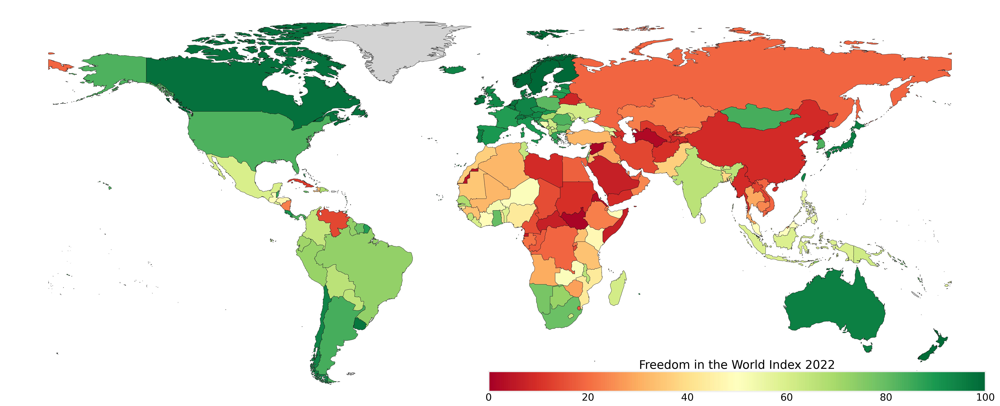

In [35]:
fig, ax = plt.subplots(figsize=(35, 20), dpi=200)
plot_world_map(fig, ax, freedom_map, 'Total Score', 'RdYlGn', vmin=0, vmax=100, caption="Freedom in the World Index 2022");

### European Results

In [36]:
freedom_index_eur = freedom_index[freedom_index.Country.isin(european_countries)].copy()
freedom_index_eur['Pos.'] = freedom_index_eur['Total Score'].rank(ascending=False, method='first').astype(int)
freedom_index_eur = freedom_index_eur.sort_values(by='Pos.').reset_index(drop=True)

In [37]:
freedom_index_eur_prev = freedom_index_prev[freedom_index_prev.Country.isin(european_countries)].copy()
freedom_index_eur_prev['Pos.'] = freedom_index_eur_prev['Total Score'].rank(ascending=False, method='first').astype(int)
freedom_index_eur_prev = freedom_index_eur_prev.sort_values(by='Pos.').reset_index(drop=True)

In [38]:
ttips = create_ttips(freedom_index_eur_prev[col_order], freedom_index_eur[col_order])

In [39]:
freedom_index_eur[col_order].sort_values(by='Pos.').style.pipe(table_style, caption='Freedom in the World Index for Europe', gradient_column=freedom_index_eur['Total Score'], vmin=0, vmax=100, ttips=ttips)

Pos.,Country,Total Score,Electoral Process,Political Pluralism,Functioning of Goverment,Discretionary Question,Political Rights Subtotal,Freedom of Expression and Belief,Associational and Organizational Rights,Rule of Law,Personal Autonomy and Individual Rights,Civil Liberties Subtotal
1,Finland,100,12,16,12,0,40,16,12,16,16,60
2,Norway,100,12,16,12,0,40,16,12,16,16,60
3,Sweden,100,12,16,12,0,40,16,12,16,16,60
4,Denmark,97,12,16,12,0,40,16,12,14,15,57
5,Ireland,97,12,16,11,0,39,16,12,14,16,58
6,Luxembourg,97,12,16,10,0,38,16,12,15,16,59
7,Netherlands,97,12,16,11,0,39,16,12,15,15,58
8,Belgium,96,12,16,11,0,39,15,12,15,15,57
9,Switzerland,96,12,15,12,0,39,15,12,15,15,57
10,Portugal,95,12,16,11,0,39,16,11,14,15,56


#### Map Visualization

In [40]:
# Plotting only Europe
freedom_map_eur = freedom_map.copy()
freedom_map_eur.loc[~freedom_map_eur.Country.isin(european_countries), 'Total Score'] = np.nan

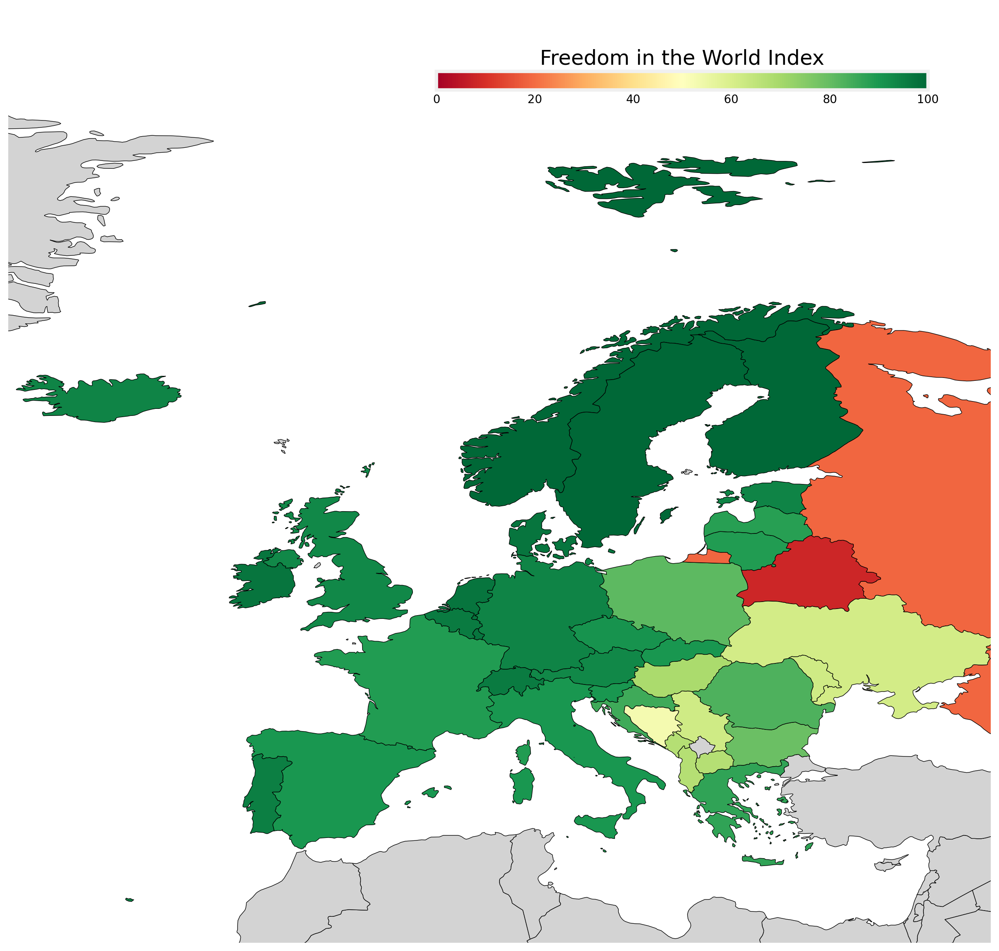

In [41]:
fig, ax = plt.subplots(figsize=(20, 15), dpi=200)
plot_europe_map(fig, ax, freedom_map_eur, 'Total Score', 'RdYlGn', vmin=0, vmax=100, caption='Freedom in the World Index');

### Note and Conclusions

As far as civil liberties and political rights are concerned, along with New Zealand and Canada the 4 Nordic countries, Finland, Norway, Sweden, and Denmark are yet again in the top 6 positions on the Freedom in the World index.

**Asia**: Similar to the World Press Freedom index countries such as Mongolia, South Korea, Japan, Taiwan, Nepal, Bhutan, Georgia, and Armenia are the bright exception compared to the rest of the Asian countries. A notable difference is India and Israel which received a positive score. Sri Lanka is also ranked well but it will be interesting to see next year's ranking after the recent events in the country. Kyrgyzstan, on the other hand, ranks low on the World Press Freedom Index.

**Africa**: Most African countries fare much worse than their respective rankings in the World Press Freedom Index. Notable exceptions are southern countries such as Namibia, Botswana, South Africa, Malawi, and Madagascar. As well as countries in sub-Saharan Africa such as Ghana, Benin, Guinea Bissau, Sierra Leone, and Liberia.

**America**: Nicaragua, Venezuela, and Cuba are in a significantly worse position than the rest of North and South America. The same countries also scored low in the World Press Freedom index.

**Europe**: Most European countries score highly on the Freedom in the World index with 31 out of 41 maintaining a score of 79 or more. Hungary, Moldova, Ukraine, and some Balkan countries receive a mediocre score. As in the case of the World press index, Russia and Belarus receive the worst score by far. It is worth noting, that the countries in the middle of the rank and below have received the same position as in the previous year with no discernable improvement.

Greece is ranked 51st worldwide and 27th among European countries, placing it higher than the rest of the Balkan countries but last compared to the countries of the European Union. Most of the lost points are in the civil liberties subcategory probably due to discrimination against racial and ethnic minority groups as well as policies on asylum and immigration.

<a id='law'></a>

## WJP Rule of Law Index

The Rule of Law Index relies on national surveys of more than 138.000 households and 4.200 legal practitioners and experts' surveys to measure how the rule of law is experienced and perceived worldwide, covering 139 countries and jurisdictions.

It is published annually by the World Justice Project (WJP), an international civil society organization with the stated mission of "working to create knowledge, build awareness, and stimulate action to advance the rule of law worldwide". WJP was founded by William H. Neukom and William C. Hubbard in 2006 as a presidential initiative of the American Bar Association and with the support of 21 partners. It became independent in 2009 and its offices are located in Washington, D.C., Mexico City, and Seattle, Washington.


The score is assessed through 44 indicators organized around 9 factors:
- Constraints on Government Powers
- Absence of Corruption
- Open Government
- Fundamental Rights
- Order and Security
- Regulatory Enforcement
- Civil Justice
- Criminal Justice
- Informal Justice

The results are collected through a set of five questionnaires administered to experts and the general public. More than 300 local experts identified per country by the WJP and local polling companies implement the household surveys.

Those questionnaires are codified as numeric values, aggregated by country, and normalized. Then the normalized scores are aggregated into sub-factors and factors using simple averages that produce the final ranking. The score ranges from 0 to 1. Again note that the latest data is for 2021.

You can learn more about the World of Justice Project on their site [https://worldjusticeproject.org/about-us](https://worldjusticeproject.org/about-us).

Their methodology is analyzed [here](https://worldjusticeproject.org/our-work/research-and-data/wjp-rule-law-index-2021/methodology) and you can download the dataset from [here](https://worldjusticeproject.org/our-work/research-and-data/wjp-rule-law-index-2021/current-historical-data).

### Data Preparation

In [42]:
file = 'data/FINAL_2021_wjp_rule_of_law_index_HISTORICAL_DATA_FILE.xlsx'

law_index = pd.read_excel(file, sheet_name='WJP ROL Index 2021 Scores', nrows=51, header=None)

law_index.info()
law_index.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51 entries, 0 to 50
Columns: 140 entries, 0 to 139
dtypes: object(140)
memory usage: 55.9+ KB


,0,1,2,3,4,5,6,7,8,9,...,130,131,132,133,134,135,136,137,138,139
0,Country,Afghanistan,Albania,Algeria,Angola,Antigua and Barbuda,Argentina,Australia,Austria,The Bahamas,...,Ukraine,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,"Venezuela, RB",Vietnam,Zambia,Zimbabwe
1,Country Code,AFG,ALB,DZA,AGO,ATG,ARG,AUS,AUT,BHS,...,UKR,ARE,GBR,USA,URY,UZB,VEN,VNM,ZMB,ZWE
2,Region,South Asia,Eastern Europe & Central Asia,Middle East & North Africa,Sub-Saharan Africa,Latin America & Caribbean,Latin America & Caribbean,East Asia & Pacific,EU + EFTA + North America,Latin America & Caribbean,...,Eastern Europe & Central Asia,Middle East & North Africa,EU + EFTA + North America,EU + EFTA + North America,Latin America & Caribbean,Eastern Europe & Central Asia,Latin America & Caribbean,East Asia & Pacific,Sub-Saharan Africa,Sub-Saharan Africa
3,Income Group*,Low,Upper middle,Lower middle,Lower middle,High,Upper middle,High,High,High,...,Lower middle,High,High,High,High,Lower middle,Upper middle,Lower middle,Lower middle,Lower middle
4,WJP Rule of Law Index: Overall Score,0.352819,0.491574,0.491954,0.427656,0.63371,0.558388,0.793455,0.812422,0.607958,...,0.509684,0.639549,0.7854,0.694982,0.713862,0.490919,0.265062,0.488843,0.443416,0.393135


In [43]:
col_selection = [0, 4, 6, 13, 18, 23, 32, 36, 42, 50]
law_index = law_index.iloc[col_selection, :].copy()
law_index = law_index.T.copy() # transpose the table
law_index.drop(index=0, inplace=True)
law_index.columns = ['Country', 'Overall Score', 'Constraints on Goverment Powers', 
                     'Absense of Corruption', 'Open Government', 'Fundamental Rights',
                    'Order and Security', 'Regulatory Enforcement', 'Civil Justice', 'Criminal Justice']

law_index.info()
law_index.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 139 entries, 1 to 139
Data columns (total 10 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Country                          139 non-null    object
 1   Overall Score                    139 non-null    object
 2   Constraints on Goverment Powers  139 non-null    object
 3   Absense of Corruption            139 non-null    object
 4   Open Government                  139 non-null    object
 5   Fundamental Rights               139 non-null    object
 6   Order and Security               139 non-null    object
 7   Regulatory Enforcement           139 non-null    object
 8   Civil Justice                    139 non-null    object
 9   Criminal Justice                 139 non-null    object
dtypes: object(10)
memory usage: 11.9+ KB


,Country,Overall Score,Constraints on Goverment Powers,Absense of Corruption,Open Government,Fundamental Rights,Order and Security,Regulatory Enforcement,Civil Justice,Criminal Justice
1,Afghanistan,0.352819,0.422913,0.296204,0.392979,0.401684,0.29605,0.360464,0.345449,0.30681
2,Albania,0.491574,0.427895,0.368125,0.468726,0.577107,0.77915,0.434221,0.472583,0.404783
3,Algeria,0.491954,0.475444,0.446689,0.353974,0.447246,0.754499,0.481974,0.550387,0.425419
4,Angola,0.427656,0.428918,0.435283,0.388427,0.387073,0.573123,0.425326,0.435201,0.347895
5,Antigua and Barbuda,0.63371,0.608021,0.594526,0.539114,0.702043,0.782952,0.632715,0.679421,0.530887


In [44]:
# Change scores to float and assigning ranking
for col in law_index.columns.tolist()[1:]:
    law_index[col] = law_index[col].astype(float)

law_index['Pos.'] = law_index['Overall Score'].rank(ascending=False).astype(int)
law_index = law_index.sort_values(by='Pos.').reset_index(drop=True)

In [45]:
# Searching for countries with different names in each dataset
diff_count, possible_matches = find_similar_countries(law_index.Country, world_map.name_long)
print(diff_count)
pprint.pprint(possible_matches)

16
{'Congo, Dem. Rep.': ['Democratic Republic of the Congo', 'Republic of Congo'],
 'Congo, Rep.': ['Republic of Congo', 'Democratic Republic of the Congo'],
 "Cote d'Ivoire": ["Côte d'Ivoire", 'Cape Verde'],
 'Egypt, Arab Rep.': ['Egypt', 'Qatar'],
 'Hong Kong SAR, China': ['Hong Kong', 'Gabon'],
 'Iran, Islamic Rep.': ['Iran', 'Iraq'],
 'Korea, Rep.': ['North Korea', 'South Korea'],
 'Kyrgyz Republic': ['Democratic Republic of the Congo',
                     'Central African Republic'],
 'Mauritius': ['Nauru', 'Saint-Martin'],
 'Russian Federation': ['Russia', 'Iran'],
 'Slovak Republic': ['Democratic Republic of the Congo',
                     'Central African Republic'],
 'St. Kitts and Nevis': ['Saint Kitts and Nevis',
                         'Saint Vincent and the Grenadines'],
 'St. Lucia': ['Saint Lucia', 'Libya'],
 'St. Vincent and the Grenadines': ['Saint Vincent and the Grenadines',
                                    'São Tomé and Principe'],
 'The Bahamas': ['Bahamas', 

In [46]:
matches = {'Congo, Dem. Rep.': 'Democratic Republic of the Congo',
           'Congo, Rep.': 'Republic of Congo',
           "Cote d'Ivoire": "Côte d'Ivoire",
           'Egypt, Arab Rep.': 'Egypt',
           'Hong Kong SAR, China': 'Hong Kong',
           'Iran, Islamic Rep.': 'Iran',
           'Korea, Rep.': 'South Korea',
           'Kyrgyz Republic': 'Kyrgyzstan',
           'Russian Federation': 'Russia',
           'Slovak Republic': 'Slovakia',
           'St. Kitts and Nevis': 'Saint Kitts and Nevis',
           'St. Lucia': 'Saint Lucia',
           'St. Vincent and the Grenadines': 'Saint Vincent and the Grenadines',
           'The Bahamas': 'Bahamas',
           'Venezuela, RB': 'Venezuela'}

law_index['Country'].replace(matches, inplace=True)

### Worldwide Results

In [47]:
col_order = ['Pos.', 'Country', 'Overall Score', 'Constraints on Goverment Powers', 
                     'Absense of Corruption', 'Open Government', 'Fundamental Rights',
                    'Order and Security', 'Regulatory Enforcement', 'Civil Justice', 'Criminal Justice']
law_index[col_order].style.pipe(table_style, caption='Rule of Law Index 2021', gradient_column=law_index['Overall Score'], vmin=0, vmax=1)

Pos.,Country,Overall Score,Constraints on Goverment Powers,Absense of Corruption,Open Government,Fundamental Rights,Order and Security,Regulatory Enforcement,Civil Justice,Criminal Justice
1,Denmark,0.90,0.94,0.95,0.87,0.92,0.92,0.89,0.86,0.83
2,Norway,0.90,0.94,0.94,0.89,0.91,0.93,0.88,0.85,0.85
3,Finland,0.88,0.92,0.89,0.87,0.90,0.92,0.87,0.82,0.84
4,Sweden,0.86,0.87,0.90,0.86,0.87,0.92,0.84,0.83,0.80
5,Germany,0.84,0.86,0.83,0.80,0.85,0.89,0.86,0.84,0.79
6,Netherlands,0.83,0.85,0.87,0.82,0.84,0.85,0.85,0.83,0.75
7,New Zealand,0.83,0.86,0.88,0.82,0.82,0.89,0.86,0.78,0.74
8,Luxembourg,0.83,0.82,0.87,0.79,0.85,0.93,0.85,0.79,0.73
9,Austria,0.81,0.85,0.82,0.70,0.85,0.91,0.82,0.75,0.80
10,Ireland,0.81,0.82,0.80,0.80,0.82,0.94,0.81,0.74,0.72


#### Map Visualization

In [48]:
law_map = world_map.merge(law_index, how='left', left_on='name_long', right_on='Country')

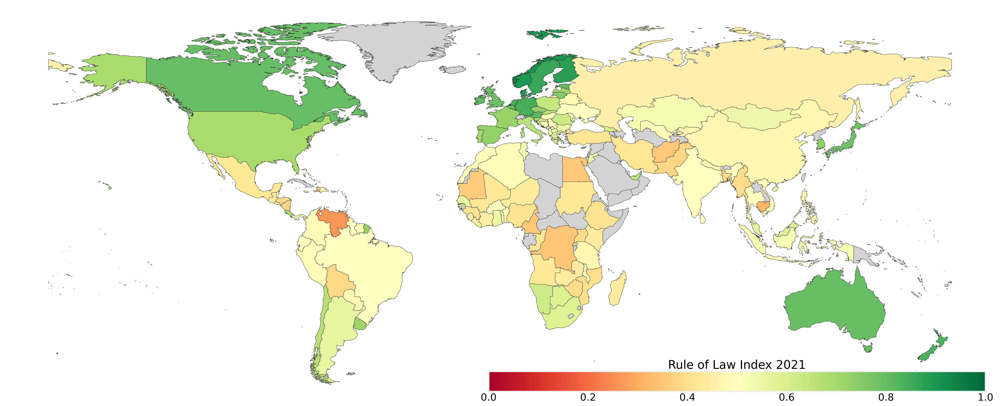

In [49]:
fig, ax = plt.subplots(figsize=(35, 20), dpi=200)
plot_world_map(fig, ax, law_map, 'Overall Score', 'RdYlGn', vmin=0, vmax=1, caption='Rule of Law Index 2021');

### European Results

In [50]:
law_index_eur = law_index[law_index.Country.isin(european_countries)].copy()

law_index_eur['Pos.'] = law_index_eur['Overall Score'].rank(ascending=False).astype(int)
law_index_eur = law_index_eur.sort_values(by='Pos.').reset_index(drop=True)

In [51]:
law_index_eur[col_order].style.pipe(table_style, caption='Rule of Law Index 2021 in Europe', gradient_column=law_index_eur['Overall Score'], vmin=0, vmax=1)

Pos.,Country,Overall Score,Constraints on Goverment Powers,Absense of Corruption,Open Government,Fundamental Rights,Order and Security,Regulatory Enforcement,Civil Justice,Criminal Justice
1,Denmark,0.90,0.94,0.95,0.87,0.92,0.92,0.89,0.86,0.83
2,Norway,0.90,0.94,0.94,0.89,0.91,0.93,0.88,0.85,0.85
3,Finland,0.88,0.92,0.89,0.87,0.90,0.92,0.87,0.82,0.84
4,Sweden,0.86,0.87,0.90,0.86,0.87,0.92,0.84,0.83,0.80
5,Germany,0.84,0.86,0.83,0.80,0.85,0.89,0.86,0.84,0.79
6,Netherlands,0.83,0.85,0.87,0.82,0.84,0.85,0.85,0.83,0.75
7,Luxembourg,0.83,0.82,0.87,0.79,0.85,0.93,0.85,0.79,0.73
8,Austria,0.81,0.85,0.82,0.70,0.85,0.91,0.82,0.75,0.80
9,Ireland,0.81,0.82,0.80,0.80,0.82,0.94,0.81,0.74,0.72
10,Estonia,0.81,0.83,0.80,0.80,0.82,0.89,0.79,0.80,0.72


#### Map Visualization

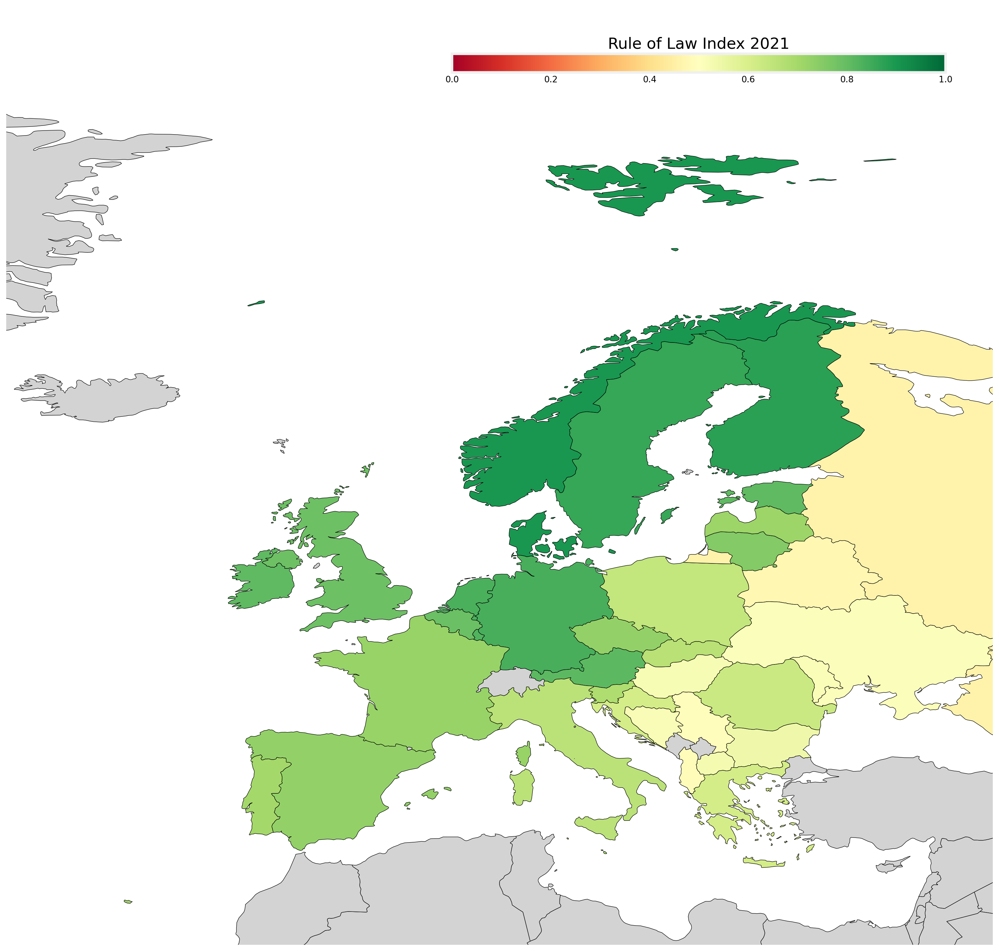

In [52]:
# Plotting only Europe
law_map_eur = law_map.copy()
law_map_eur.loc[~law_map_eur.Country.isin(european_countries), 'Overall Score'] = np.nan

fig, ax = plt.subplots(figsize=(35, 20), dpi=200)
plot_europe_map(fig, ax, law_map_eur, 'Overall Score', 'RdYlGn', vmin=0, vmax=1, caption='Rule of Law Index 2021');

<a id='cpi'></a>

## Corruption Perceptions Index

The Corruption Perceptions Index (CPI) is published annually since 1995 by Transparency International, a German registered association founded in 1993 by former employees of the World Bank. Based in Berlin, Transparency International is a non-profit, non-governmental organization purposed to combat global corruption and prevent criminal activities arising from it.

CPI ranks countries and territories based on how corrupt their public sector is perceived to be, determined by at least 3 data sources drawn from 13 different corruption surveys and assessments. These data sources are collected by a variety of institutions, including the World Bank and the World Economic Forum. CPI has received criticism over the years firstly due to the difficulty in measuring corruption, which, by definition, happens behind the scenes, and secondly, the need to rely on third-party surveys to compile the index.

The index ranks 180 countries and territories around the world and the results are given on a scale of 0 (highly corrupt) to 100 (very clean).

If you want to learn more about Transparency International you can visit their site [https://www.transparency.org](https://www.transparency.org/en/about). You can read more about the scoring methodology [here](https://www.transparency.org/en/news/how-cpi-scores-are-calculated) and here, you can download the data [CPI (2021) by Transparency International is licensed under CC-BYND 4.0](https://images.transparencycdn.org/images/CPI-2021-Full-Data-Set.zip)
Note that the latest data available are from 2021 compared to the other datasets.

### Data Preparation

In [53]:
file = 'data/CPI2021_GlobalResults&Trends.xlsx'

cpi_index = pd.read_excel(file, sheet_name='CPI 2021', skiprows=2)
cpi_index.info()
cpi_index.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 22 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   Country / Territory                                  180 non-null    object 
 1   ISO3                                                 180 non-null    object 
 2   Region                                               180 non-null    object 
 3   CPI score 2021                                       180 non-null    int64  
 4   Rank                                                 180 non-null    int64  
 5   Standard error                                       180 non-null    float64
 6   Number of sources                                    180 non-null    int64  
 7   Lower CI                                             180 non-null    float64
 8   Upper CI                                             180 non-null    f

,Country / Territory,ISO3,Region,CPI score 2021,Rank,Standard error,Number of sources,Lower CI,Upper CI,African Development Bank CPIA,...,Economist Intelligence Unit Country Ratings,Freedom House Nations in Transit,Global Insights Country Risk Ratings,IMD World Competitiveness Yearbook,PERC Asia Risk Guide,PRS International Country Risk Guide,Varieties of Democracy Project,World Bank CPIA,World Economic Forum EOS,World Justice Project Rule of Law Index
0,Denmark,DNK,WE/EU,88,1,1.850507,8,84.95592,91.04408,NaN,...,90.0,NaN,83,93.0,NaN,100.0,79.0,NaN,78.0,87.0
1,Finland,FIN,WE/EU,88,1,1.248280,8,85.94658,90.05342,NaN,...,90.0,NaN,83,94.0,NaN,93.0,77.0,NaN,91.0,87.0
2,New Zealand,NZL,AP,88,1,1.427644,8,85.65153,90.34847,NaN,...,90.0,NaN,83,91.0,NaN,93.0,78.0,NaN,85.0,83.0
3,Norway,NOR,WE/EU,85,4,1.072085,7,83.23642,86.76358,NaN,...,90.0,NaN,83,81.0,NaN,85.0,78.0,NaN,NaN,87.0
4,Singapore,SGP,AP,85,4,1.159654,9,83.09237,86.90763,NaN,...,90.0,NaN,83,87.0,91.0,85.0,78.0,NaN,91.0,84.0


In [54]:
# Selecting Columns
cpi_index = cpi_index.iloc[:, [0, 3, 4]].copy()
cpi_index.shape

(180, 3)

In [55]:
cpi_index.columns = ['Country', 'CPI Score', 'Pos.']
cpi_index.isnull().sum()

Country      0
CPI Score    0
Pos.         0
dtype: int64

In [56]:
# Searching for countries with different names in each dataset
diff_count, possible_matches = find_similar_countries(cpi_index.Country, world_map.name_long)
print(diff_count)
pprint.pprint(possible_matches)

15
{'Cabo Verde': ['Cape Verde', 'Macao'],
 'Congo': ['Republic of Congo', 'Tonga'],
 "Cote d'Ivoire": ["Côte d'Ivoire", 'Cape Verde'],
 'Czechia': ['Czech Republic'],
 'Eswatini': ['Swaziland', 'Palestine'],
 'Gambia': ['The Gambia', 'Guam'],
 'Guinea Bissau': ['Guinea-Bissau', 'Nauru'],
 'Korea, North': ['North Korea', 'South Korea'],
 'Korea, South': ['South Korea', 'North Korea'],
 'Laos': ['Lao PDR'],
 'Maldives': [],
 'Mauritius': ['Nauru', 'Saint-Martin'],
 'Sao Tome and Principe': ['São Tomé and Principe', 'Samoa'],
 'Seychelles': [],
 'United States of America': ['United States', 'Isle of Man']}


In [57]:
matches = {'Cabo Verde': 'Cape Verde',
          'Congo': 'Republic of Congo',
          "Cote d'Ivoire": "Côte d'Ivoire",
          'Czechia': 'Czech Republic',
          'Eswatini': 'Swaziland',
          'Gambia': 'The Gambia',
          'Guinea Bissau': 'Guinea-Bissau',
          'Korea, North': 'North Korea',
          'Korea, South': 'South Korea',
          'Laos': 'Lao PDR',
          'Sao Tome and Principe': 'São Tomé and Principe',
          'United States of America': 'United States'}

cpi_index['Country'].replace(matches, inplace=True)

### Worldwide Results

In [58]:
col_order = ['Pos.', 'Country', 'CPI Score']
cpi_index[col_order].style.pipe(table_style, caption='CPI (2021) by Transparency International', gradient_column=cpi_index['CPI Score'], vmin=0, vmax=100)

Pos.,Country,CPI Score
1,Denmark,88
1,Finland,88
1,New Zealand,88
4,Norway,85
4,Singapore,85
4,Sweden,85
7,Switzerland,84
8,Netherlands,82
9,Luxembourg,81
10,Germany,80


#### Map Visualization

In [59]:
cpi_map = world_map.merge(cpi_index, how='left', left_on='name_long', right_on='Country')

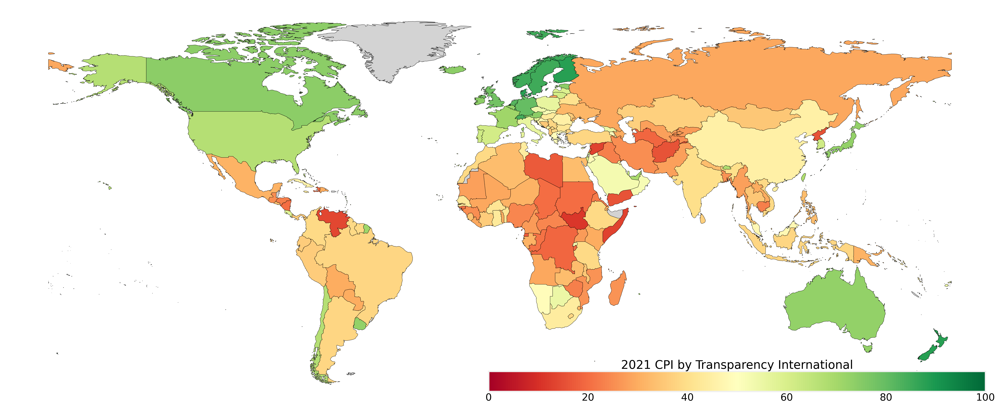

In [60]:
fig, ax = plt.subplots(figsize=(35, 20), dpi=200)
plot_world_map(fig, ax, cpi_map, 'CPI Score', 'RdYlGn', vmin=0, vmax=100, caption="2021 CPI by Transparency International");

### European Results

In [61]:
cpi_index_eur = cpi_index[cpi_index.Country.isin(european_countries)].copy()

cpi_index_eur['Pos.'] = cpi_index_eur['CPI Score'].rank(ascending=False).astype(int)

In [62]:
cpi_index_eur[col_order].sort_values(by='Pos.').style.pipe(table_style, caption='CPI (2021) European Countries rank by Transparency International ', gradient_column=cpi_index_eur['CPI Score'], vmin=0, vmax=100)

Pos.,Country,CPI Score
1,Denmark,88
1,Finland,88
3,Norway,85
3,Sweden,85
5,Switzerland,84
6,Netherlands,82
7,Luxembourg,81
8,Germany,80
9,United Kingdom,78
11,Austria,74


#### Map Visualization

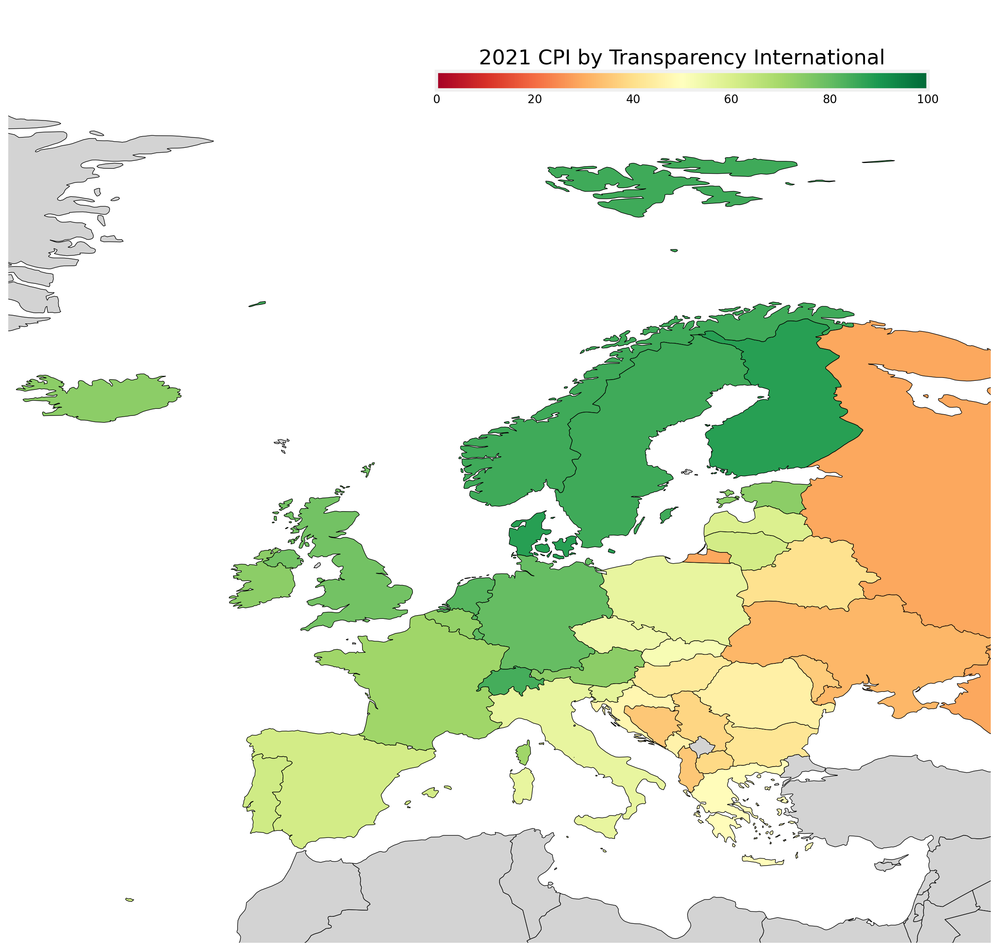

In [63]:
# Plotting only Europe
cpi_map_eur = cpi_map.copy()
cpi_map_eur.loc[~cpi_map_eur.Country.isin(european_countries), 'CPI Score'] = np.nan

fig, ax = plt.subplots(figsize=(20, 15), dpi=200)
plot_europe_map(fig, ax, cpi_map_eur, 'CPI Score', 'RdYlGn', vmin=0, vmax=100, caption="2021 CPI by Transparency International");

<a id='combined'></a>

## Combined Results

In [64]:
combined_table = press_index[['Country', 'Global Score']].merge(freedom_index[['Country', 'Total Score']], how='outer', on='Country')

combined_table = combined_table.merge(cpi_index[['Country', 'CPI Score']], how='outer', on='Country')

combined_table = combined_table.merge(law_index[['Country', 'Overall Score']], how='outer', on='Country')

combined_table.columns = ['Country', 'Press Index Score', 'Freedom Index Score', 'CPI Score', 'Law Index Score']

In [65]:
combined_table['Law Index Score'] = combined_table['Law Index Score'] * 100

In [66]:
combined_table = combined_table.sort_values(by='Country').reset_index(drop=True)

In [67]:
def final_table_style(styler, caption, vmin, vmax):
    styler.set_caption(caption) # Table title
    styler.set_table_styles([{'selector': 'caption', 'props':'font-size:1.25em;'}], # Title style
                              overwrite=False)
    styler.format(precision=2, na_rep='') # rounding floats
    styler.background_gradient(cmap='RdYlGn', vmin=vmin, vmax=vmax) # applying background color
    styler.set_sticky(axis="columns") # Fixed column names
    styler.set_table_styles([ dict(selector='th', props=[('text-align', 'left')])], # Text allignment
                              overwrite=False)
    styler.set_table_styles([ dict(selector='td', props=[('text-align', 'left')])], # Text allignment
                              overwrite=False)
    styler.highlight_null(null_color='white')
    styler.format(na_rep='', formatter=lambda x: round(x/100, 2), subset='Law Index Score')
    
    return styler.hide()

In [68]:
combined_table.style.pipe(final_table_style, caption='', vmin=0, vmax=100)

Country,Press Index Score,Freedom Index Score,CPI Score,Law Index Score
Abkhazia,,40.00,,
Afghanistan,38.27,10.00,16.00,0.35
Albania,56.41,67.00,35.00,0.49
Algeria,45.53,32.00,33.00,0.49
Andorra,68.79,93.00,,
Angola,57.17,30.00,29.00,0.43
Antigua and Barbuda,,85.00,,0.63
Argentina,77.28,84.00,38.00,0.56
Armenia,68.97,55.00,49.00,
Australia,73.77,95.00,73.00,0.79


In [69]:
combined_table_eur = combined_table[combined_table.Country.isin(european_countries)].copy()

In [70]:
combined_table_eur.style.pipe(final_table_style, caption='', vmin=0, vmax=100)

Country,Press Index Score,Freedom Index Score,CPI Score,Law Index Score
Albania,56.41,67.00,35.00,0.49
Andorra,68.79,93.00,,
Austria,76.74,93.00,74.00,0.81
Belarus,39.62,8.00,41.00,0.48
Belgium,78.86,96.00,73.00,0.79
Bosnia and Herzegovina,65.64,53.00,35.00,0.52
Bulgaria,59.12,79.00,42.00,0.54
Croatia,70.42,85.00,47.00,0.61
Czech Republic,80.54,91.00,54.00,0.73
Denmark,90.27,97.00,88.00,0.9
